Objective: Sound Classification

*   Load data
    * Read metadata
    * Add some extra information into meta data
*   Exploratory Data Analysis(EDA)
    *   Load and read sound data
    *   Visualize the data  
*   Feature Engineering
*   Feature Selection
*   Modeling: 
    * Traditional Machine learning 
    * Deep learning

In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [2]:
import os
import glob
import shutil

from   zipfile           import ZipFile
from   tarfile           import open

import numpy             as np
import pandas            as pd 
import seaborn           as sns
import matplotlib.pyplot as plt 

import soundfile       as sf
import librosa 
from   librosa         import display
from   IPython.display import Audio, display

from   tqdm import tqdm
from   time import time

# For Feature extraction part 
#===============================================================================
# Import package if it doesn't install
#===============================================================================
def import_installed(package):
    try: 
        return __import__(package)
    except ImportError:      
       os.system('python -m pip install {}'.format(package))
       

! git clone git://git.code.sf.net/p/sox/code sox
import_installed('opensmile')
import_installed('audiofile') 

import opensmile

from sympy                         import Symbol

from sklearn.preprocessing         import LabelEncoder    , StandardScaler
from sklearn.feature_selection     import SelectKBest     , f_classif
from sklearn.model_selection       import train_test_split, RepeatedStratifiedKFold, cross_val_score , GridSearchCV
from sklearn.pipeline              import Pipeline

from sklearn.linear_model          import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes           import GaussianNB
from sklearn.svm                   import SVC
from sklearn.neighbors             import KNeighborsClassifier
from sklearn.neural_network        import MLPClassifier
from sklearn.tree                  import DecisionTreeClassifier
from sklearn.ensemble              import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier

from sklearn.metrics               import classification_report, confusion_matrix

from warnings                      import filterwarnings
filterwarnings('ignore')

Cloning into 'sox'...
remote: Enumerating objects: 21459, done.
remote: Counting objects: 100% (21459/21459), done.
remote: Compressing objects: 100% (6373/6373), done.
remote: Total 21459 (delta 17036), reused 18749 (delta 15002)
Receiving objects: 100% (21459/21459), 7.18 MiB | 12.22 MiB/s, done.
Resolving deltas: 100% (17036/17036), done.


SoX could not be found!

    If you do not have SoX, proceed here:
     - - - http://sox.sourceforge.net/ - - -

    If you do (or think that you should) have SoX, double-check your
    path variables.
    


# Custome Codes

In [3]:
#===============================================================================
# Extract Compress File
#===============================================================================
## First Method
def extract_file_m1(file_path):
  if os.path.exists('/content/UrbanSound8K'):
    print('File exists')  
  else:
    if file_path.endswith("zip"):
        with ZipFile(file=file_path, mode='r',) as zf:
          zf.extractall()
          print('Zip Done!')
    elif file_path.endswith("tar.gz"):
          tar = open(file_path, mode='r:gz')
          tar.extractall()        
          tar.close()
          print('tar.gz Done!')
    elif file_path.endswith("tar"):
          tar = open(file_path, mode='r:')
          tar.extractall()
          tar.close()
          print('tar Done!')
    else:
        print('Your file is not  zip, tar.gz or tar')

## Second Method
def extract_file_m2(file_path, extract_path):    
        shutil.unpack_archive(file_path, extract_path)
        print('Done!')


# f = Informs the tar command that the next parameter is the file name of the archive.
# j = Filters the archive through bzip2.
# v = Verbose (optional). Displays the files as they are decompressed.
# x = Extracts files from an archive.
# z = Filters the archive through gzip.
# C = Sends the output to a specific directory.
## Third Method 
# !tar -xzvf '/content/drive/MyDrive/UrbanSound8K.tar.gz' -C '/content/'  



#===============================================================================
# Label Transformation with LabelEncoder
#===============================================================================
def label_transform(labels):
    '''
    #===========================================================================
    # Transformation of labels from categorical into numerical
    #===========================================================================

    Input Parameters:      
      Labels: Categorical(string)

    Output Parameters:
      Transformed label: List
      Label encoder    :
    '''
    le = LabelEncoder()              # Define 
    le.fit(labels)                   # Fit 
    return le.transform(labels), le  # Transform, Define


#===============================================================================
# Feature Extraction
#===============================================================================
def feature_extraction(df, sampling_rate, root_path):
      '''
      #=========================================================================
      # Feature Extraction
      #=========================================================================

      Input Parameters:
      df            : [dataframe] in order to extract the file_path of data and save labels 
      sampling_rate : [Integer][Hz]
      root_path     : [String] root directory of sound files

      Output Parameters:      
      extracted_features:[List] which contain features and labels
      '''

      extracted_features=[]
      for index_num, row in tqdm(df.iterrows()): 
          # Read path of sound file      
          file_name             = os.path.join(os.path.abspath(root_path),'fold'+str(row["fold"])+'/', str(row["slice_file_name"]))
          # Load the sound file
          signal, sampling_rate = librosa.load(file_name, sr=sampling_rate, mono=True)
          # Do feature extraction
          smile                 = opensmile.Smile(feature_set=opensmile.FeatureSet.eGeMAPSv02, feature_level=opensmile.FeatureLevel.Functionals)      
          data                  = smile.process_signal(signal, sampling_rate)
          # Add the labels into data
          data['label']         = row['class']
          # Finally add (feature, label) to the end of the list extracted_features.
          extracted_features.append(data)
      return extracted_features
#===============================================================================
# Modeling 
#===============================================================================
def all_models(X, y, scoring='f1_macro', plot=True):    
    '''
    #===========================================================================
    # Applying different Classification Methods
    #===========================================================================

    Input Parameters:
      X: Features
      y: Labels

    Output Parameters:
      plot         : If True (plot boxplot of all models)
      print        : Result as (mean ± std & duration time of process)
      name_models  : The names of models
      result_models: 
    '''
   
    models           = []
    cv_result_models = []
    name_models      = []

    class_models  = [
                    ('LR'              , LogisticRegression(solver='liblinear', multi_class='ovr')),
                    ('Ridge'           , RidgeClassifier()),               
                    ('SGD'             , SGDClassifier()),
                    ('LDA'             , LinearDiscriminantAnalysis()),
                    ('GNB'             , GaussianNB()),
                    ('KNeighbors'      , KNeighborsClassifier()),
                    ('MLP'             , MLPClassifier(max_iter=1000, random_state=121)),                
                    ('DecisionTree'    , DecisionTreeClassifier()),
                    ('RandomForest'    , RandomForestClassifier()),
                    ('ExtraTrees'      , ExtraTreesClassifier()),
                    ('Bagging'         , BaggingClassifier()),
                    ('AdaBoost'        , AdaBoostClassifier()),
                    ('GradientBoosting', GradientBoostingClassifier())                
                    ]

    for cm in class_models:
        models.append(cm)  

    for model_name , estimator  in class_models:
        start_time = time()  
        KF         = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=121)
        CV         = cross_val_score(estimator, X, y, cv=KF, scoring=scoring)
        end_time   = time()

        cv_result_models.append(CV)
        name_models.append(model_name)

        print(f"The result of Estimator_{model_name} = {np.round(CV.mean(), decimals=3)}{Symbol(u'±')}{np.round(CV.std(), decimals=3)} with process_time = {np.round((end_time - start_time), decimals=3)} Sec'")
    if plot:
        # Plot the result for comparison of all algorithms
        fig, ax = plt.subplots(figsize=(17,3))
        plt.boxplot(cv_result_models, labels=name_models)
        plt.grid()
        plt.title('ML_Algorithms')
    return  name_models, cv_result_models


def Optimize_num_top_features(X, y, range_features=(70,100), classifier= ExtraTreesClassifier(), score_func= f_classif, cv= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=121), scoring_GRIDSEARCHCV='f1_macro'):
    '''                                                                  
    #===========================================================================
    # Identify top number of features based on highest score on data
    #===========================================================================

    Input Parameters:
      X                    :[List]  Features
      y                    :[List]  Labels
      range_features       :[Tuple](start_point, end_point) the number of features to search from _ to _
      classifier           :Define the Classifier
      score_func           :Define the score function in order to use for feature selection process
      CV                   :Define the method to divides the data in folds
      scoring_GRIDSEARCHCV :Scoring method to use in GridSearchCV method

    Output Parameters:
      print                   : Print the result of best score and parameter from GridSearchCV 
      final_selected_features : 
    '''                  
    selected_features       = SelectKBest(score_func=score_func)
    param                   = {'NumTopFeatures__k':[i for i in range(range_features[0], range_features[1])]}
    fs_model_pipeline       = Pipeline(steps=[('NumTopFeatures', selected_features), ('Model', classifier)])
    k_search                = GridSearchCV(fs_model_pipeline, param, cv=cv, scoring=scoring_GRIDSEARCHCV)
    final_selected_features = k_search.fit(X, y)

    print(50*'-')
    print('Best %s Score: %.3f  and  Best Param: %s'%(scoring_GRIDSEARCHCV,  final_selected_features.best_score_, final_selected_features.best_params_))
    print(50*'-')
     

Short description about some expression:
*   Sampling_rate(Fs) [Hz]:
    * It defines the number of samples per second of digital data. The higher the sample rate means more samples per seconds. Typical sample rates are 44.1kHz, 48kHz, 96kHz and 192kHz. For examples,  a sampling rate of 44100 Hz means 44100 samples per second.
*   No_channels : 
    *   An audio file can contain one, two or even more Channels. In the monophonic(mono) sound, there is one channel and in stereophonic (stereo) sound, there are two channels.
*   PCM:
    *   PCM stands for Pulse-Code. It is used as the industry standard for storing analog waves in a digital format. PCM_16 means 16 bit depth. 
        * PCM_24: Signed 24 bit PCM
        * PCM_16: Signed 16 bit PCM
        * PCM_S8: Signed 8  bit PCM
   
*   Bit depth: 
    *   It means how many bits are used for one sample. It describes  the quality of sound and typically the audio formats use a bit depth of 8bit, 16bit or 24bit.

# Load and Read Data
  * Extract UrbanSound8K.tar.gz file (https://urbansounddataset.weebly.com/urbansound8k.html)
  * Load and read extracted data
 

In [4]:
%%time
# Unzip the Sound Data
file_path    = '/content/drive/MyDrive/UrbanSound8K.tar.gz'
extract_path = '/content/'

# First method
extract_file_m1(file_path)

# Second method
# extract_file_m2(file_path, extract_path)

tar.gz Done!
CPU times: user 1min 11s, sys: 15.8 s, total: 1min 27s
Wall time: 5min 11s


In [5]:
%%time
# Get Information from Given Metadata of Data
df1 = pd.read_csv("/content/UrbanSound8K/metadata/UrbanSound8K.csv")

# Add more Information to Given Metadata such as Sampling_rate, Bit depth, Number of channles, Duration of wave sound
def wav_extra_info(full_path, show_info=False): 
    data   = sf.read(full_path)    
    ob     = sf.SoundFile(full_path) 
    if show_info:   
        print('Sampling_Rate [Fs]   : {} Hz'.format(ob.samplerate))
        print('No.Channels          : {}'.format(ob.channels))
        print('Pulse-Code Modulation: {}'.format(ob.subtype))
        print('Time Duration        : {} Second'.format(round((data[0].shape[0]/ob.samplerate), 2)))
        print('NO.Samples           : {}'.format(data[0].shape[0]))    
    return (ob.samplerate, ob.channels, ob.subtype, round((data[0].shape[0]/ob.samplerate), 2) , data[0].shape[0])

WEI = []
for i in range(len(df1)):
    WEI.append(wav_extra_info(os.path.join ('/content/UrbanSound8K/audio',
                                           str('fold{}'.format(df1['fold'].iloc[i])),
                                           df1['slice_file_name'].iloc[i])))
    
# Add New Information into Given Metadata
df1[['sampling_rate(Fs)[Hz]','no_channels','pcm','time_duration[s]','number_of_samples']] = pd.DataFrame(WEI)
print('The shape of dataset = ', df1.shape)
print(100*'-')
print(df1['class'].value_counts(normalize=False))
print(100*'-')

The shape of dataset =  (8732, 13)
----------------------------------------------------------------------------------------------------
street_music        1000
children_playing    1000
jackhammer          1000
dog_bark            1000
drilling            1000
engine_idling       1000
air_conditioner     1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64
----------------------------------------------------------------------------------------------------
CPU times: user 11.4 s, sys: 4.71 s, total: 16.1 s
Wall time: 2min 34s


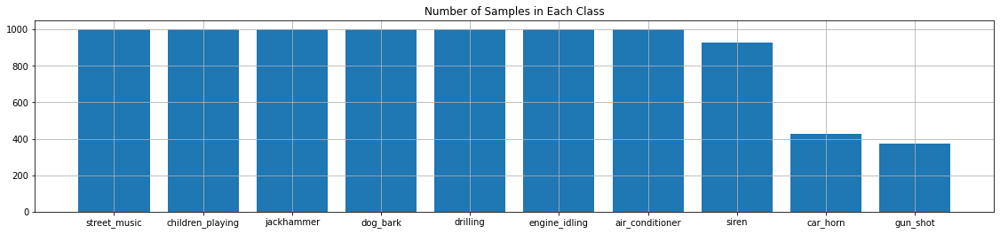

In [6]:
# Consider if label is balanced.
fig         = plt.figure(figsize=(15,3))
ax          = fig.add_axes([0,0,1,1])
classes     = list(df1['class'].value_counts(normalize=False).index)
num_classes = df1['class'].value_counts(normalize=False).values
ax.bar(classes, num_classes)
ax.set_title('Number of Samples in Each Class')
ax.grid()

In [7]:
df1.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,sampling_rate(Fs)[Hz],no_channels,pcm,time_duration[s],number_of_samples
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,44100,2,PCM_16,0.32,14004
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,44100,2,PCM_16,4.00,176400
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,44100,2,PCM_16,4.00,176400
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,44100,2,PCM_16,4.00,176400
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,44100,2,PCM_16,4.00,176400


# Exploratory Data Analysis(EDA)

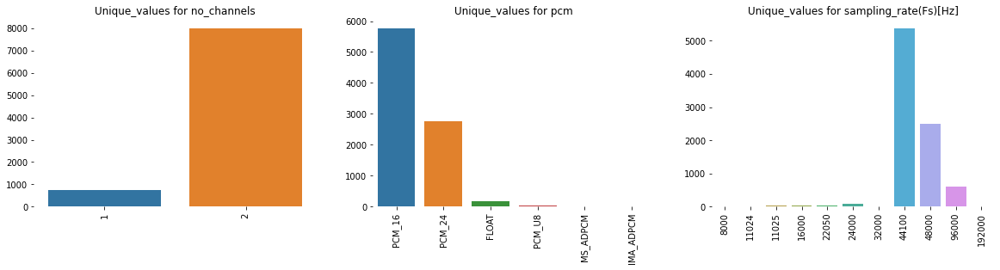

In [8]:
# Consider unique_values available in some columns of data
nc  = df1['no_channels'].value_counts().to_frame().sort_values(by='no_channels', ascending=False)
pcm = df1['pcm'].value_counts().to_frame().sort_values(by='pcm', ascending=False)
sr  = df1['sampling_rate(Fs)[Hz]'].value_counts().to_frame().sort_values(by='sampling_rate(Fs)[Hz]', ascending=False)

X_axis = [list(nc.index), list(pcm.index), list(sr.index)]
Y_axis = ['no_channels','pcm','sampling_rate(Fs)[Hz]']
dataF  = [nc,pcm,sr]
fig, ax = plt.subplots(1,3, figsize=(20,4))

for i in range(len(dataF)):
    s = sns.barplot(x= X_axis[i], y=Y_axis[i], data=dataF[i], ax=ax[i])
    ax[i].set_xticklabels(s.get_xticklabels(), rotation=90)
    ax[i].set_title('Unique_values for {}'.format(Y_axis[i]))
    ax[i].set_ylabel('')
    sns.despine(left=True, bottom=True)  


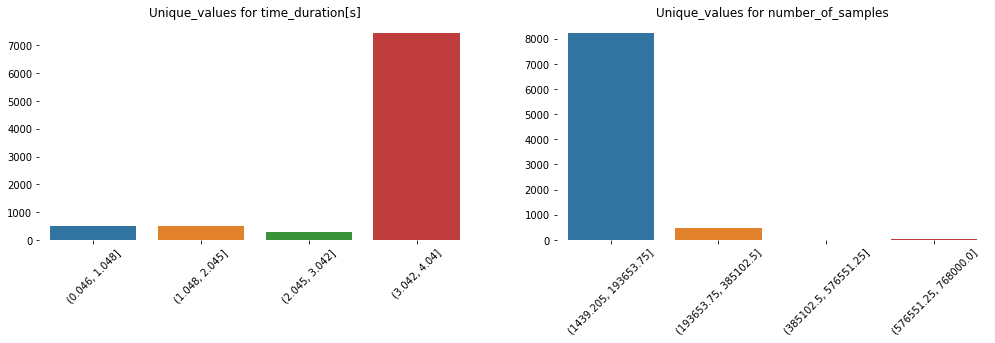

In [9]:
# In order to visualize the bar plot, here the data is categorical into 4 parts.
td  = df1['time_duration[s]'].value_counts().to_frame().sort_values(by='time_duration[s]'  , ascending=False)
ns  = df1['number_of_samples'].value_counts().to_frame().sort_values(by='number_of_samples', ascending=False)

idx_td = pd.cut(td.index, bins=4, right=True, include_lowest=False)
td_agg = td.groupby(idx_td, as_index=False).sum()

idx_ns = pd.cut(ns.index, bins=4, right=True, include_lowest=False)
ns_agg = ns.groupby(idx_ns, as_index=False).sum()



X_axis = [list(idx_td.categories), list(idx_ns.categories)]
Y_axis = ['time_duration[s]','number_of_samples']
dataF  = [td_agg, ns_agg]

fig, ax = plt.subplots(1,2, figsize=(17,4))
for i in range(len(dataF)):
    s = sns.barplot(x= X_axis[i], y=Y_axis[i], data=dataF[i], ax=ax[i])
    ax[i].set_xticklabels(s.get_xticklabels(), rotation=45)
    ax[i].set_title('Unique_values for {}'.format(Y_axis[i]))
    ax[i].set_ylabel('')
    sns.despine(left=True, bottom=True)    

In [10]:
# To identify the number of different categories available in each fold. We have 10 folds
vc = []
for i in range(1, len(df1['fold'].value_counts())+1):
    vc.append(df1[df1['fold']==i]['class'].value_counts())
    
df2 = pd.DataFrame(vc, index=['fold_{}'.format(i) for i in range(1, len(df1['fold'].value_counts())+1)])
df2.head(10)

,jackhammer,children_playing,dog_bark,drilling,air_conditioner,street_music,engine_idling,siren,car_horn,gun_shot
fold_1,120,100,100,100,100,100,96,86,36,35
fold_2,120,100,100,100,100,100,100,91,42,35
fold_3,120,100,100,100,100,100,107,119,43,36
fold_4,120,100,100,100,100,100,107,166,59,38
fold_5,120,100,100,100,100,100,107,71,98,40
fold_6,68,100,100,100,100,100,107,74,28,46
fold_7,76,100,100,100,100,100,106,77,28,51
fold_8,78,100,100,100,100,100,88,80,30,30
fold_9,82,100,100,100,100,100,89,82,32,31
fold_10,96,100,100,100,100,100,93,83,33,32


In [11]:
# Create a sample of data from fold1 for each class in order to use for further analysis.
# Label of sound files
label_map         = {'0' : 'air_conditioner', '1' : 'car_horn', '2' : 'children_playing', '3' : 'dog_bark', '4' : 'drilling', 
                     '5' : 'engine_idling'  , '6' : 'gun_shot', '7' : 'jackhammer'      , '8' : 'siren'   , '9' : 'street_music'}

# Sound files available on fold1 
sound_files_fold1 = glob.glob('/content/UrbanSound8K/audio/fold1/*')                 
print(f'The number of files in fold1 which is used for exploratory data analysis: {len(sound_files_fold1)}')
print(100*"-")


# Load the label and related sound files and assign them into the "files_label" and "files_label_sample" where "file_label " containes all sound data  whereas "files_label_sample" is used to show some samples of sound data 
files_label        = [(label_map[key], [sf for sf in sound_files_fold1 if sf.split('-')[-3] == key]) for key in label_map.keys()]

files_label_sample = [(label_map[key], [sf for sf in sound_files_fold1 if sf.split('-')[-3] == key][0]) for key in label_map.keys()]
files_label_sample

The number of files in fold1 which is used for exploratory data analysis: 873
----------------------------------------------------------------------------------------------------


[('air_conditioner', '/content/UrbanSound8K/audio/fold1/57320-0-0-5.wav'),
 ('car_horn', '/content/UrbanSound8K/audio/fold1/87275-1-5-0.wav'),
 ('children_playing', '/content/UrbanSound8K/audio/fold1/182800-2-3-0.wav'),
 ('dog_bark', '/content/UrbanSound8K/audio/fold1/31323-3-0-2.wav'),
 ('drilling', '/content/UrbanSound8K/audio/fold1/147764-4-1-0.wav'),
 ('engine_idling', '/content/UrbanSound8K/audio/fold1/17592-5-1-3.wav'),
 ('gun_shot', '/content/UrbanSound8K/audio/fold1/197318-6-0-0.wav'),
 ('jackhammer', '/content/UrbanSound8K/audio/fold1/180937-7-1-10.wav'),
 ('siren', '/content/UrbanSound8K/audio/fold1/159738-8-0-9.wav'),
 ('street_music', '/content/UrbanSound8K/audio/fold1/124489-9-0-6.wav')]

In [13]:
# Listen to some sample from each class
sampling_rate = 22050
for title, filename_path  in  files_label_sample:   
    print(title,':')
    display(Audio(filename_path, rate=sampling_rate))

air_conditioner :


car_horn :


children_playing :


dog_bark :


drilling :


engine_idling :


gun_shot :


jackhammer :


siren :


street_music :


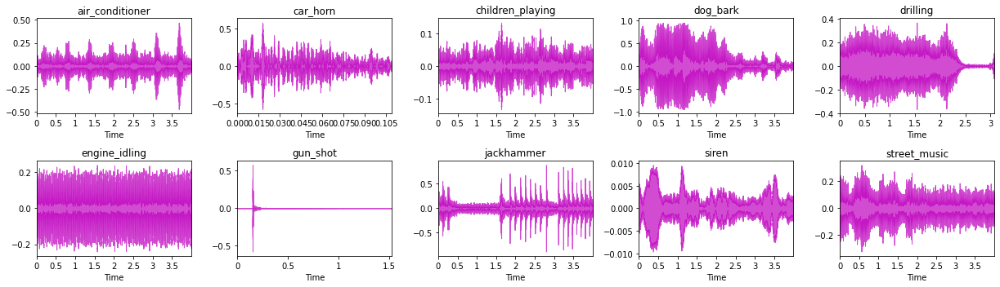

In [14]:
# plot the sound data to some sample from each class
fig, ax = plt.subplots(2,5, figsize=(17,5))
ax      = ax.ravel()

for i, (title, filename_path) in enumerate(files_label_sample):     
     data, sampling_rate = librosa.load(filename_path, sr=sampling_rate)        
     librosa.display.waveplot(data, ax=ax[i], sr=sampling_rate, color='m', alpha=0.7)
     ax[i].set_title(title)

plt.tight_layout()

# Feature Engineering:
It can be performed in different domains like  Time Domain,  Frequency Domain or Wavelet Domain. Here, it uses 88 features which are extracted from opensmile.

There are three topics which we can consider here. (i) The duration of sound which is different here. In some feature extraction, it is necessary to have the same duration in order to have the same length of features as output for each sound. In this case, it is necessary to have the same length of data.(ii) Sampling_rate, it may cause artifact in frequency domain if it not selected correctly in some sound data (iii) Time computation depends on the different selection of sampling_rate or bit depth or time duration. Here we use only one window with different duration and sampling_rate = 96000 Hz (We can also use several windows with overlap or no-overlap).

In [15]:
# List of feature 's name
smile = opensmile.Smile(feature_set=opensmile.FeatureSet.eGeMAPSv02, feature_level=opensmile.FeatureLevel.Functionals)
print(50*'-')
print(f'Number of features: {len(smile.feature_names)}')
print(50*'-')
print('Name of three extracted features:\n',smile.feature_names[:3])

--------------------------------------------------
Number of features: 88
--------------------------------------------------
Name of three extracted features:
 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_stddevNorm', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0']


In [ ]:
%%time
# Extract Features
sampling_rate      = 96000
extracted_features = []
for index_num, row in tqdm(df1.iterrows()):    
      file_name             = os.path.join(os.path.abspath('/content/UrbanSound8K/audio'),'fold'+str(row["fold"])+'/', str(row["slice_file_name"]))
      signal, sampling_rate = librosa.load(file_name, sr=sampling_rate, mono=True)
      smile                 = opensmile.Smile(feature_set=opensmile.FeatureSet.eGeMAPSv02, feature_level=opensmile.FeatureLevel.Functionals)      
      data                  = smile.process_signal(signal, sampling_rate)
      data['label']         = row['class']
      
      extracted_features.append(data)


# Save the features and name of features
try:
    np.save('/content/drive/MyDrive/features_final', extracted_features)
    np.save('/content/drive/MyDrive/columnName_features_final', extracted_features[0].columns)
except Exception as e:
    print(e)

8325it [1:59:44,  1.49it/s]/usr/local/lib/python3.7/dist-packages/opensmile/core/smile.py:306: UserWarning: Segment too short, filling with NaN.
  UserWarning("Segment too short, filling with NaN.")
8732it [2:05:47,  1.16it/s]

CPU times: user 2h 3min 48s, sys: 57.3 s, total: 2h 4min 45s
Wall time: 2h 5min 47s


In [16]:
# Load the features and create a dataframe
features      = np.load('/content/drive/MyDrive/features_final.npy', allow_pickle=True)
name_features = np.load('/content/drive/MyDrive/columnName_features_final.npy', allow_pickle=True)
df_features   = pd.DataFrame(data=features.squeeze(), columns=name_features)
print('The shape of dataframe from extracted features = (%d, %d)'%(df_features.shape[0], df_features.shape[1]))
df_features.head(4)

The shape of dataframe from extracted features = (8732, 89)


,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,loudness_sma3_stddevNorm,loudness_sma3_percentile20.0,loudness_sma3_percentile50.0,loudness_sma3_percentile80.0,loudness_sma3_pctlrange0-2,loudness_sma3_meanRisingSlope,loudness_sma3_stddevRisingSlope,loudness_sma3_meanFallingSlope,loudness_sma3_stddevFallingSlope,spectralFlux_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,mfcc4_sma3_amean,mfcc4_sma3_stddevNorm,jitterLocal_sma3nz_amean,jitterLocal_sma3nz_stddevNorm,shimmerLocaldB_sma3nz_amean,shimmerLocaldB_sma3nz_stddevNorm,HNRdBACF_sma3nz_amean,HNRdBACF_sma3nz_stddevNorm,logRelF0-H1-H2_sma3nz_amean,logRelF0-H1-H2_sma3nz_stddevNorm,logRelF0-H1-A3_sma3nz_amean,logRelF0-H1-A3_sma3nz_stddevNorm,...,F2bandwidth_sma3nz_stddevNorm,F2amplitudeLogRelF0_sma3nz_amean,F2amplitudeLogRelF0_sma3nz_stddevNorm,F3frequency_sma3nz_amean,F3frequency_sma3nz_stddevNorm,F3bandwidth_sma3nz_amean,F3bandwidth_sma3nz_stddevNorm,F3amplitudeLogRelF0_sma3nz_amean,F3amplitudeLogRelF0_sma3nz_stddevNorm,alphaRatioV_sma3nz_amean,alphaRatioV_sma3nz_stddevNorm,hammarbergIndexV_sma3nz_amean,hammarbergIndexV_sma3nz_stddevNorm,slopeV0-500_sma3nz_amean,slopeV0-500_sma3nz_stddevNorm,slopeV500-1500_sma3nz_amean,slopeV500-1500_sma3nz_stddevNorm,spectralFluxV_sma3nz_amean,spectralFluxV_sma3nz_stddevNorm,mfcc1V_sma3nz_amean,mfcc1V_sma3nz_stddevNorm,mfcc2V_sma3nz_amean,mfcc2V_sma3nz_stddevNorm,mfcc3V_sma3nz_amean,mfcc3V_sma3nz_stddevNorm,mfcc4V_sma3nz_amean,mfcc4V_sma3nz_stddevNorm,alphaRatioUV_sma3nz_amean,hammarbergIndexUV_sma3nz_amean,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,label
0,46.4533,0.0946186,41.2993,45.9983,51.7616,10.4623,87.6497,0,-93.8379,0,4.37921,0.783317,1.12859,3.07483,8.26972,7.14113,104.388,0,-49.6062,0,6.4257,0.92578,2.41575,2.63647,-56.8056,-0.0967249,-22.0527,-0.263927,-5.57556,-1.82149,0.125322,0.545058,1.83021,0.343478,-2.61202,-0.915509,-6.01726,-1.76485,7.46087,1.12978,...,0.120802,29.4674,0.171389,3037.73,0.0441021,878.744,0.115115,20.5118,0.359583,5.30494,0.901147,7.51249,0.473989,0.0574015,0.380115,0.00808303,1.44059,8.35563,0.667444,1.03546,6.12009,-58.6234,-0.0762115,-23.8571,-0.211305,-8.10938,-1.2067,0,0,0,0,0,3.33333,4.16667,0.23,0,0,0,-15.4353,dog_bark
1,25.2091,0.618699,13.8007,17.2022,39.6749,25.8743,214.302,119.842,790.569,1338.94,0.544542,0.249237,0.418821,0.532533,0.637883,0.219062,1.70045,0.915898,1.42955,0.90357,0.220157,0.31398,11.9072,0.277893,-12.969,-0.494769,27.1867,0.246418,-0.917994,-7.73312,0.0751802,1.10753,1.44701,0.444693,-4.71507,-1.01228,6.01309,6.26583,-5.19442,-4.31951,...,0.467079,-126.94,-0.656002,2580.12,0.116209,708.616,0.384851,-121.786,-0.699873,-3.18284,-1.68715,9.29506,0.700115,-0.0422314,-0.546329,0.000518234,9.60763,0.219975,0.319411,12.9465,0.276988,-13.1807,-0.584622,28.1068,0.191895,-2.10615,-2.62123,-1.77029,7.1252,-0.0380835,0.00101179,0.221534,3.25815,5.65553,0.0622727,0.0523043,0.113333,0.135236,-47.666,children_playing
2,18.2326,0.3665,13.9909,17.6825,20.1733,6.18237,431.048,954.543,105.859,69.9818,0.401716,0.153084,0.339223,0.393712,0.4652,0.125977,1.03434,0.436183,0.932679,0.521597,0.166213,0.246749,16.223,0.198008,-10.9078,-0.479579,22.4023,0.367813,1.0813,5.1423,0.178361,1.09984,1.54068,0.445777,-5.54576,-0.6897,0.223797,101.142,3.31491,6.02437,...,0.275058,-92.2574,-0.879374,2763.

# Short Description about Feature Selection Methods:
* Filter Method (Based on univariate statistical measurement to select the most relevant features)[Interaction between variables[features, predictors, independent variables] will not be considered by these methods [collinearity problem may arise])
   * Regression(Numerical-__Numerical__):
       * Pearson  correlation Coef.(Linear)[assumption a Gaussian distribution and linear relationship on each features)
       * Spearman rank        coef.(Non-Linear) 
       * Mutual-Information (Information gain)
   * Regression(Categorical-__Numerical__):
       * ANOVA    correlation coef.(Linear)
       * Kendall  rank        coef.(Non-Linear)      
   * Classification(Numerical-__Categorical__)
       * ANOVA    correlation coef.(Linear)
       * Kendall  rank        coef.(Non-Linear) [assumption the categorical to be ordinal][ordinal(position of something in a list) like  first, second, third, fourth, etc]
   * Classification(Categorical-__Categorical__)
       * Chi-Squared
       * Mutual-Information (Information gain)
* Wrapper Method(Based on creation of more models with its subset of features, to  identify the best featured which are maximized the model performance)
   * Recursive Feature Elimination(RFE)

* Embedded Method (Based on algorithms which have their own built-in feature selection method ( with performing feature selection during the training process that some of the most popular machine earning model can point to Lasso and Ridge model)





---



# Further process after feature extraction:
*  Transform labels from categorical(string) to Number(integer)
*  Impute some of features if NaN values after feature extraction
*  Splitting the data
*  Feature scalling
*  Modeling without feature selection
*  Applying feature selection on logistic regression method in order to see how feature selection can help to increase the performance of model
*  Selecting the best model
*  Hyperparameter tuning on best model and Feature_importance from model
*  Evalution of the Performance of best model on test data



In [17]:
# Check if extracted features contain any NaN values and Transfrom labels from categorical (string) to Number(integer)

print(50*'-', 'Check if extracted features contain any NaN values', 50*'-')
# Check if extracted features contain any NaN values and if they contain any NaN values impute them.
print(f'Features contain any NaN values = {df_features.isnull().sum().any()}')
# Fill the NaN values with zero value. You can use any method of imputation
df_features.fillna(0, inplace=True) 
# Again Check if imputed features contain any NaN values
print(f'Features contain any NaN values = {df_features.isnull().sum().any()}')


# Separate data into features and labels
features = df_features[df_features.columns[:-1]]
labels   = df_features['label']

#Transfrom labels(Categorical --> Numerical)
Tran_labels , le = label_transform(labels)

# print the result before and after transformation
print(50*'-', 'Labels before using LabelEncoder', 50*'-')
print(list(labels[:5]))
print(50*'-', 'Labels after using LabelEncoder', 50*'-')
print(Tran_labels[:5]) 

-------------------------------------------------- Check if extracted features contain any NaN values --------------------------------------------------
Features contain any NaN values = True
Features contain any NaN values = False
-------------------------------------------------- Labels before using LabelEncoder --------------------------------------------------
['dog_bark', 'children_playing', 'children_playing', 'children_playing', 'children_playing']
-------------------------------------------------- Labels after using LabelEncoder --------------------------------------------------
[3 2 2 2 2]


Split Data

In [18]:
# Split the data
Xtrain, Xtest, ytrain, ytest = train_test_split(features, labels, test_size=0.2, random_state=121, stratify=labels)
print('Xtrain_shape = {}, ytrain_shape = {},\nXtest_shape = {}, ytest_shape = {}'.format(Xtrain.shape, ytrain.shape, Xtest.shape, ytest.shape))

Xtrain_shape = (6985, 88), ytrain_shape = (6985,),
Xtest_shape = (1747, 88), ytest_shape = (1747,)


Standardize features
   *  Removing the mean and scaling to unit variance

In [19]:
# Some of models need to be standardized or normalized (scaling the features) due to their sensitivity to the range of the data points such as Distance-based algorithms (SVM, KNN, K-means)
# or method works with gradient descent based algorithms like(Linear and Logistic Regression, Neural Network(NN))
# After transformation each feature approximatly will has (mean~0 and std~1)
SS       = StandardScaler()          # define
SSXtrain = SS.fit_transform(Xtrain)  # fit on train and then transform on train 
SSXtest  = SS.transform(Xtest)       # only transform on test

print('The train shape of features {} and shape of labels {}'.format(SSXtrain.shape, ytrain.shape))
print('The test  shape of features {} and shape of labels {}'.format(SSXtest.shape , ytest.shape))

The train shape of features (6985, 88) and shape of labels (6985,)
The test  shape of features (1747, 88) and shape of labels (1747,)


The result of Estimator_LR = 0.742±0.015 with process_time = 109.017 Sec'
The result of Estimator_Ridge = 0.687±0.02 with process_time = 2.724 Sec'
The result of Estimator_SGD = 0.685±0.02 with process_time = 23.835 Sec'
The result of Estimator_LDA = 0.699±0.015 with process_time = 6.0 Sec'
The result of Estimator_GNB = 0.417±0.018 with process_time = 0.951 Sec'
The result of Estimator_KNeighbors = 0.818±0.016 with process_time = 24.524 Sec'
The result of Estimator_MLP = 0.849±0.011 with process_time = 624.493 Sec'
The result of Estimator_DecisionTree = 0.696±0.013 with process_time = 26.912 Sec'
The result of Estimator_RandomForest = 0.88±0.012 with process_time = 166.267 Sec'
The result of Estimator_ExtraTrees = 0.899±0.011 with process_time = 39.202 Sec'
The result of Estimator_Bagging = 0.809±0.016 with process_time = 154.706 Sec'
The result of Estimator_AdaBoost = 0.285±0.059 with process_time = 146.039 Sec'
The result of Estimator_GradientBoosting = 0.842±0.014 with process_time 

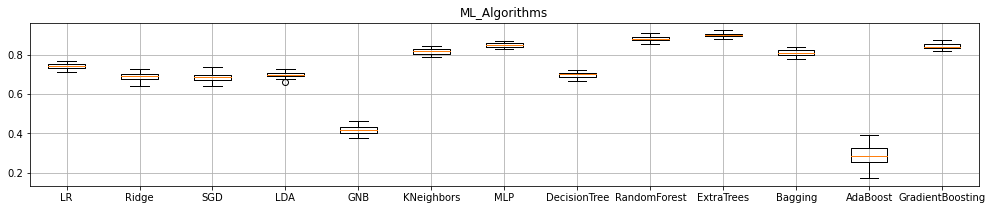

In [20]:
# Modelling as default parameters and without using the feature selection
name_models, cv_results = all_models(SSXtrain, ytrain, plot=True)

In [21]:
# Modelling with feature selection on LogisticRegression in order to see which features are important and how it can improve the result. 
# The feature selection as a method of detection of important features can reduce the time of computation on training part, reducing the model complexity (easier to interpret) and increasing the accuracy of a model.

Optimize_num_top_features(SSXtrain, ytrain, 
                          range_features=(1, 88),
                          classifier= LogisticRegression(solver='liblinear', multi_class='ovr'),
                          score_func= f_classif,
                          cv= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=121),
                          scoring_GRIDSEARCHCV='f1_macro')


In [22]:
Optimize_num_top_features(SSXtrain, ytrain, 
                          range_features=(1, 88),
                          classifier= ExtraTreesClassifier(),
                          score_func= f_classif,
                          cv= RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=121),
                          scoring_GRIDSEARCHCV='f1_macro')

# --------------------------------------------------
# Best f1_macro Score: 0.905  and  Best Param: {'nfs__k': 49}
# --------------------------------------------------

In [23]:
# Hyperparameter tuning on best model (Note: This could take some time to finish)

cv          = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
param_grid = {              
              "n_estimators"       : [100, 500, 1000],        # 1000
              "max_depth"          : [None, range(1, 8)],     # None              
              "min_samples_leaf"   : range(1, 7),             # 1  
              "min_samples_split"  : range(2, 7),             # 3     
              "class_weight"       : ['balanced', None],      # 'balanced'
              }

searchCV_result = GridSearchCV(estimator=ExtraTreesClassifier() , scoring='f1_macro', cv=cv, param_grid=param_grid, verbose=True)
searchCV_result.fit(SSXtrain, ytrain)
print("Best: %f using %s" % (searchCV_result.best_score_, searchCV_result.best_params_))

# Best: 0.905939 using {'class_weight': 'balanced', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 1000}

In [24]:
best_model = ExtraTreesClassifier(n_estimators=1000, min_samples_leaf=1, min_samples_split=3,  max_depth= None, class_weight= 'balanced')
best_model.fit(SSXtrain, ytrain)

print(10*'-','classification_report',10*'-')
print(classification_report(ytest, best_model.predict(SSXtest)))
print()
print(10*'-','confusion_matrix', 10*'-')
print(confusion_matrix(ytest, best_model.predict(SSXtest)))

---------- classification_report ----------
                  precision    recall  f1-score   support

 air_conditioner       0.95      0.96      0.96       200
        car_horn       0.93      0.77      0.84        86
children_playing       0.81      0.92      0.86       200
        dog_bark       0.93      0.78      0.85       200
        drilling       0.90      0.93      0.91       200
   engine_idling       0.96      0.96      0.96       200
        gun_shot       1.00      0.93      0.97        75
      jackhammer       0.90      0.97      0.93       200
           siren       0.92      0.94      0.93       186
    street_music       0.86      0.86      0.86       200

        accuracy                           0.91      1747
       macro avg       0.92      0.90      0.91      1747
    weighted avg       0.91      0.91      0.91      1747


---------- confusion_matrix ----------
[[192   0   0   0   2   0   0   3   1   2]
 [  4  66   3   3   1   2   0   3   1   3]
 [  0   0 184  

Save the final ML model on disk with below methods:
 
* Pickle  Approch
* cPickle Approch
* Joblib  Approch 


In [25]:
# Save the Model
# from  sklearn.externals import joblib
import  joblib
import  pickle
import _pickle as cPickle

def timer_process(start_time, end_time):
    hours  , remainder = divmod(end_time - start_time , 3600)
    minutes, seconds   = divmod(remainder, 60)        
    print("Duration in time:  {:0>2}:{:0>2}:{:2.7f} [HH:MM:SS.FFFFFFF]".format(int(hours), int(minutes), seconds))
        
def file_size(filename):    
    print(f"The size of file: {os.path.getsize(os.path.join(os.getcwd(),filename+'.pkl'))} [KB]" )



def save_load_model(classifier, filename, mode='save', method='joblib'):
    '''                                                                  
    #===========================================================================
    # Saving and Loading ML Model
    #===========================================================================

    Input Parameters:     
      classifier  :Define the Classifier
      filename    :[String] Name of file to save or load
      mode        :[String] 'save' or 'load'
      method      :[String] method of saving or loading ('pickle','cpickle','joblib') approaches

    Output Parameters:
      return: save model in root directory and load the model from root directory with report of duration of time, filesize
    '''  
    #=====================================================
    #=============== Save(dump) the model ================
    #=====================================================
    if mode.lower()=='save':

        if  method.lower() =='pickle':
             start_time = time()
             with open(filename+'.pkl', 'wb') as f:  
                  pickle.dump(classifier, f)
             end_time = time()
             timer_process(start_time, end_time)
                

        elif method.lower() =='cpickle':
             start_time = time()
             with open(filename+'.pkl', 'wb') as f:  
                  cPickle.dump(classifier, f)  
             end_time = time()
             timer_process(start_time, end_time)      

        elif method.lower()=='joblib':   
             start_time = time() 
             joblib.dump(classifier, filename+'.pkl')
             end_time = time()
             timer_process(start_time, end_time)
            

        else:
            print('"__method__" can be "pickle", "cPickle", "joblib"')     
    #===============================================
    #=============== Load the Model  ===============
    #===============================================
    elif mode.lower()=='load':
      
        if method.lower() =='pickle':
            start_time = time() 
            with open(filename+'.pkl', 'rb') as f:                 
               model = pickle.load(f)
               print(20*'-','Load of time duration and file_size', 20*'-')
               end_time = time()
               timer_process(start_time, end_time)
               file_size(filename)
               print(77*'-')
               return model
            # end_time = time()
            # timer_process(start_time, end_time)
            # 

        elif method.lower() =='cpickle':
            start_time = time()
            with open(filename+'.pkl', 'rb') as f:  
               model = cPickle.load(f)
               print(20*'-','Load of time duration and file_size', 20*'-')
               end_time = time()
               timer_process(start_time, end_time)
               file_size(filename)
               print(77*'-')
               return model

        elif method.lower()=='joblib': 
                start_time = time()
                model = joblib.load(filename+'.pkl')
                print(20*'-','Load of time duration and file_size', 20*'-')
                end_time = time()
                timer_process(start_time, end_time)
                file_size(filename)
                print(77*'-')
                return model

        else:
          print('"__method__" can be "pickle", "cPickle", "joblib"')        

    else:
      print('"__mode__" can be "save" or "load" ') 

In [26]:
# Save the model

save_load_model(best_model,'finalmodel_joblib', mode='save', method='joblib')
# save_load_model(best_model,'finalmodel_pickle', mode='save', method='pickle')

Duration in time:  00:00:2.3356407 [HH:MM:SS.FFFFFFF]


In [27]:
# Load the model

best_model_j = save_load_model(best_model,'finalmodel_joblib', mode='load', method='joblib')
# best_model_p = save_load_model(best_model,'finalmodel_pickle', mode='load', method='pickle')

-------------------- Load of time duration and file_size --------------------
Duration in time:  00:00:2.4520931 [HH:MM:SS.FFFFFFF]
The size of file: 576916314 [KB]
-----------------------------------------------------------------------------


In [28]:
# Load the model and assess the model on test dataset.
test_score = best_model_j.score(SSXtest, ytest) 
print("Test score: {:.2f} %".format(100 * test_score))  
# Predict on test data 
y_prediction = best_model.predict(SSXtest) 
print(50*'-') 

for i in range(6):
    print(y_prediction[i],'|', ytest.values[i])

Test score: 90.78 %
--------------------------------------------------
jackhammer | car_horn
dog_bark | dog_bark
drilling | drilling
children_playing | children_playing
car_horn | car_horn
siren | siren


* Note:
  * For new data, we need to
      * Do feature extraction
      * Check that they do not contain any Nan values(impute them same as training)
      * Apply scaling of the features
      * Use the final trained model.